In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd "/content/drive/MyDrive/P2P"

/content/drive/.shortcut-targets-by-id/1B_15CC5yXIDwM2D1zkSfniGaNp2Icue-/P2P


In [ ]:
import sys
sys.path.append("/content/drive/MyDrive/P2P")

In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
# --- General Imports ---
import torch
import numpy as np
from PIL import Image
from scipy.io.wavfile import write
from IPython.display import Audio, display
from pathlib import Path
from typing import List, Optional, Union

# --- Diffusers Imports ---
from diffusers import StableDiffusionPipeline

# --- Local Riffusion Module Imports ---
from riffusion.spectrogram_params import SpectrogramParams
from riffusion.spectrogram_image_converter import SpectrogramImageConverter

# --- Local P2P Module Imports ---
import ptp_utils
import seq_aligner
from ptp_utils import (
    AttentionControl,
    AttentionReplace,
    AttentionRefine,
    AttentionReweight,
    LocalBlend,
    EmptyControl
)

# --- Global Settings & Device Selection ---
print("Setting up device...")
if torch.cuda.is_available():
    device = "cuda"
    torch_dtype = torch.float16
elif torch.backends.mps.is_available():
    device = "mps"
    torch_dtype = torch.float32
else:
    device = "cpu"
    torch_dtype = torch.float32

# --- Load the Pipeline ---
print("\nLoading StableDiffusionPipeline for Riffusion model...")
ldm_stable = StableDiffusionPipeline.from_pretrained(
    "riffusion/riffusion-model-v1",
    torch_dtype=torch_dtype,
    safety_checker=None,
).to(device)
tokenizer = ldm_stable.tokenizer
print("✅ Setup complete. Pipeline is ready to use.")

/usr/local/lib/python3.12/dist-packages/pydub/utils.py:300: SyntaxWarning: invalid escape sequence '\('
  m = re.match('([su]([0-9]{1,2})p?) \(([0-9]{1,2}) bit\)$', token)
/usr/local/lib/python3.12/dist-packages/pydub/utils.py:301: SyntaxWarning: invalid escape sequence '\('
  m2 = re.match('([su]([0-9]{1,2})p?)( \(default\))?$', token)
/usr/local/lib/python3.12/dist-packages/pydub/utils.py:310: SyntaxWarning: invalid escape sequence '\('
  elif re.match('(flt)p?( \(default\))?$', token):
/usr/local/lib/python3.12/dist-packages/pydub/utils.py:314: SyntaxWarning: invalid escape sequence '\('
  elif re.match('(dbl)p?( \(default\))?$', token):


Setting up device...

Loading StableDiffusionPipeline for Riffusion model...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/284 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

text_encoder/pytorch_model.bin:   0%|          | 0.00/492M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.bin:   0%|          | 0.00/335M [00:00<?, ?B/s]

unet/diffusion_pytorch_model.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--riffusion--riffusion-model-v1/snapshots/8f2e752c74e8316c6eb4fdaa6598a46ce1d88af5/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--riffusion--riffusion-model-v1/snapshots/8f2e752c74e8316c6eb4fdaa6598a46ce1d88af5/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--riffusion--riffusion-model-v1/snapshots/8f2e752c74e8316c6eb4fdaa6598a46ce1d88af5/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--riffusion--riffusion-model-v1/snapshots/8f2e752c74e8316c6eb4fdaa6598a46ce1d88af5/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
You have disabled the safety checker for <class 

✅ Setup complete. Pipeline is ready to use.


In [ ]:
import contextlib
# one-time setup for running on colab with gpu
is_cuda    = torch.cuda.is_available()
device     = torch.device("cuda") if is_cuda else torch.device("cpu")     # for diffusers & tensors
device_str = f"cuda:{torch.cuda.current_device()}" if is_cuda else "cpu"  # for riffusion converters
pipe_dtype = torch.float16 if is_cuda else torch.float32
ldm_stable.to(device=device, dtype=pipe_dtype)     # for riffusion converters

StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.35.1",
  "_name_or_path": "riffusion/riffusion-model-v1",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [ ]:
def generate_audio(
    prompt: str,
    seed: int,
    negative_prompt: str = "",
    num_steps: int = 50,
    guidance: float = 7.0,
    output_filename: str = "generated_audio.wav"
):
    # make sure no P2P hooks are active
    ptp_utils.register_attention_control(ldm_stable, None)
    print(f"🎵 Generating audio for prompt: '{prompt}' with seed: {seed}")

    generator = torch.Generator(device=device).manual_seed(seed)
    amp = torch.autocast(device_type="cuda", dtype=torch.float16) if is_cuda else contextlib.nullcontext()
    with amp:
        out = ldm_stable(
            prompt=prompt,
            negative_prompt=negative_prompt or None,
            num_inference_steps=num_steps,
            guidance_scale=guidance,
            height=512, width=512,
            generator=generator,
            output_type="pil",
        )
    output_image = out.images[0]

    # Convert spectrogram image -> audio (Riffusion expects a *string* device)
    params = SpectrogramParams()
    converter = SpectrogramImageConverter(params=params, device=device_str)
    segment = converter.audio_from_spectrogram_image(image=output_image)

    audio_np = np.array(segment.get_array_of_samples(), dtype=np.float32)
    audio_np /= np.iinfo(segment.array_type).max
    sample_rate = segment.frame_rate

    print("▶️ Playing generated audio...")
    display(Audio(data=audio_np, rate=sample_rate))

    print(f"💾 Saving audio to {output_filename}...")
    write(output_filename, sample_rate, (audio_np * 32767).astype(np.int16))
    print("✅ Done.")


# --- Example Usage ---
print("--- Running Text-to-Audio Example ---")
generate_audio(
    prompt="crisp boom-bap kit, punchy kick, snappy snare, subtle vinyl hiss, 88 bpm, 8-bar loop, no vocals",
    seed=12345
)

--- Running Text-to-Audio Example ---
🎵 Generating audio for prompt: 'crisp boom-bap kit, punchy kick, snappy snare, subtle vinyl hiss, 88 bpm, 8-bar loop, no vocals' with seed: 12345


  0%|          | 0/50 [00:00<?, ?it/s]

▶️ Playing generated audio...


💾 Saving audio to generated_audio.wav...
✅ Done.


In [ ]:
# Helper function for P2P generation, using ptp_utils
@torch.no_grad()
def _run_p2p_generation(
    prompts: List[str],
    controller: AttentionControl,
    seed: int,
    num_steps: int,
    guidance: float,
):
    ptp_utils.register_attention_control(ldm_stable, controller)
    generator = torch.Generator(device=device).manual_seed(seed)

    height = width = 512
    batch_size = len(prompts)

    # Tokenize on the model device
    text_input = tokenizer(
        prompts, padding="max_length", max_length=tokenizer.model_max_length,
        truncation=True, return_tensors="pt"
    ).to(device)
    # Encode text -> cast to UNet dtype/device
    text_embeddings = ldm_stable.text_encoder(text_input.input_ids)[0]
    unet_dtype = getattr(ldm_stable.unet, "dtype", torch.float16 if is_cuda else torch.float32)
    text_embeddings = text_embeddings.to(device=device, dtype=unet_dtype)

    # Unconditional embeddings
    negative_prompt_embeds = None
    if guidance and guidance > 1.0:
        uncond_input = tokenizer(
            [""] * batch_size, padding="max_length",
            max_length=tokenizer.model_max_length,
            truncation=True, return_tensors="pt",
        ).to(device)
        negative_prompt_embeds = ldm_stable.text_encoder(uncond_input.input_ids)[0]
        negative_prompt_embeds = negative_prompt_embeds.to(device=device, dtype=unet_dtype)

    # Latents on same device/dtype
    latent = torch.randn(
        (1, ldm_stable.unet.config.in_channels, height // 8, width // 8),
        generator=generator, device=device, dtype=text_embeddings.dtype, #it wastext_embeddings.dtype
    )
    latents = latent.expand(batch_size, *latent.shape[1:])

    amp = torch.autocast(device_type="cuda", dtype=torch.float16) if is_cuda else contextlib.nullcontext()
    with amp:
      out = ldm_stable(
        prompt_embeds=text_embeddings,
        negative_prompt_embeds=negative_prompt_embeds,
        latents=latents,
        num_inference_steps=num_steps,
        guidance_scale=guidance,
        output_type='pil'
     )
    images = out.images
    return images

def generate_p2p_audio_edit(
    source_prompt: str,
    target_prompt: str,
    seed: int,
    num_steps: int = 50,
    guidance: float = 7.0,
    cross_replace_steps: float = 0.8,
    self_replace_steps: float = 0.4,
):
    """
    Performs a P2P edit between two prompts and displays/saves both audio clips.
    """
    prompts = [source_prompt, target_prompt]
    print(f"🎭 Performing P2P edit:\n   Source: '{source_prompt}'\n   Target: '{target_prompt}'")

    # Create the attention controller
    controller = AttentionReplace(
        prompts, num_steps,
        cross_replace_steps=cross_replace_steps,
        self_replace_steps=self_replace_steps,
        tokenizer=tokenizer, device=device
    )

    # Generate spectrograms
    images = _run_p2p_generation(
        prompts, controller, seed, num_steps, guidance
    )
    source_spectrogram, edited_spectrogram = images[0], images[1]

    # Convert spectrograms to audio
    params = SpectrogramParams()
    converter = SpectrogramImageConverter(params=params, device=device_str)

    # Source audio
    source_segment = converter.audio_from_spectrogram_image(image=source_spectrogram)
    source_audio_np = np.array(source_segment.get_array_of_samples()).astype(np.float32)
    source_audio_np /= np.iinfo(source_segment.array_type).max
    sample_rate = source_segment.frame_rate

    # Edited audio
    edited_segment = converter.audio_from_spectrogram_image(image=edited_spectrogram)
    edited_audio_np = np.array(edited_segment.get_array_of_samples()).astype(np.float32)
    edited_audio_np /= np.iinfo(edited_segment.array_type).max

    # Display and save results
    print("\n--- SOURCE AUDIO ---")
    display(Audio(data=source_audio_np, rate=sample_rate))
    write(f"p2p_source_{seed}.wav", sample_rate, (source_audio_np * 32767).astype(np.int16))

    print("\n--- EDITED AUDIO (P2P) ---")
    display(Audio(data=edited_audio_np, rate=sample_rate))
    write(f"p2p_edited_{seed}.wav", sample_rate, (edited_audio_np * 32767).astype(np.int16))
    print("✅ Done.")

    return (source_spectrogram, edited_spectrogram), (source_audio_np, edited_audio_np)

In the following example we can clearly hear the instrument swap (flute--> violin) while the underlying piano melody stays the same.

To be added to presentation

In [ ]:
# Replacing example: swapping uplifting with melancholic
print("--- Running P2P Audio Edit Example ---")

# Let's use the seed from the single generation example for consistency
p2p_seed = 12345

images, audio_clips = generate_p2p_audio_edit(
    source_prompt="solo piano, piano lead melody, flute accompaniment, only piano and flute, no other instruments",
    target_prompt= "solo piano, piano lead melody, violin accompaniment, only piano and violin, no other instruments",
    guidance = 5, # reduced for better generations
    seed=p2p_seed,
    cross_replace_steps=0.8, # Let's inject for 80% of the steps
)

# generating from skratch the target audio for comparison
print("--- Freshly generated target audio ---")

freshgen = generate_audio(
    prompt="solo piano, piano lead melody, violin accompaniment, only piano and violin, no other instruments",
    seed=12345, guidance = 5
)

--- Running P2P Audio Edit Example ---
🎭 Performing P2P edit:
   Source: 'solo piano, piano lead melody, flute accompaniment, only piano and flute, no other instruments'
   Target: 'solo piano, piano lead melody, violin accompaniment, only piano and violin, no other instruments'


  0%|          | 0/50 [00:00<?, ?it/s]


--- SOURCE AUDIO ---



--- EDITED AUDIO (P2P) ---


✅ Done.
--- Freshly generated target audio ---
🎵 Generating audio for prompt: 'solo piano, piano lead melody, violin accompaniment, only piano and violin, no other instruments' with seed: 12345


  0%|          | 0/50 [00:00<?, ?it/s]

▶️ Playing generated audio...


💾 Saving audio to generated_audio.wav...
✅ Done.


The next one higlihts the difference between p2p edit and freshly generated audios. The underlyng rithm and melody is not the same as the source audio.

In [ ]:
# --- New P2P Example: Swapping "piano" for "synth" ---
print("--- Running New P2P Audio Edit Example ---")

# Let's use the seed from the single generation example for consistency
p2p_seed = 12345

images, audio_clips = generate_p2p_audio_edit(
    source_prompt="a slow chilling hip hop beat, with vocals",
    target_prompt= "a fast energetic hip hop beat, with vocals",
    seed=p2p_seed,
    guidance = 5,
    cross_replace_steps=0.8, # Let's edit for 40% of the steps
)

# generating from skratch the target audio for comparison
print("--- Freshly generated target audio ---")

freshgen = generate_audio(
    prompt="a fast energetic hip hop beat, with vocals",
    seed=12345, guidance = 5
)

--- Running New P2P Audio Edit Example ---
🎭 Performing P2P edit:
   Source: 'a slow chilling hip hop beat, with vocals'
   Target: 'a fast energetic hip hop beat, with vocals'


  0%|          | 0/50 [00:00<?, ?it/s]


--- SOURCE AUDIO ---



--- EDITED AUDIO (P2P) ---


✅ Done.
--- Freshly generated target audio ---
🎵 Generating audio for prompt: 'a fast energetic hip hop beat, with vocals' with seed: 12345


  0%|          | 0/50 [00:00<?, ?it/s]

▶️ Playing generated audio...


💾 Saving audio to generated_audio.wav...
✅ Done.


### the one on the presentation

--- Running New P2P Audio Edit Example ---
🎭 Performing P2P edit:
   Source: 'acid techno beat'
   Target: 'real tekno beat'


  0%|          | 0/50 [00:00<?, ?it/s]


--- SOURCE AUDIO ---



--- EDITED AUDIO (P2P) ---


✅ Done.


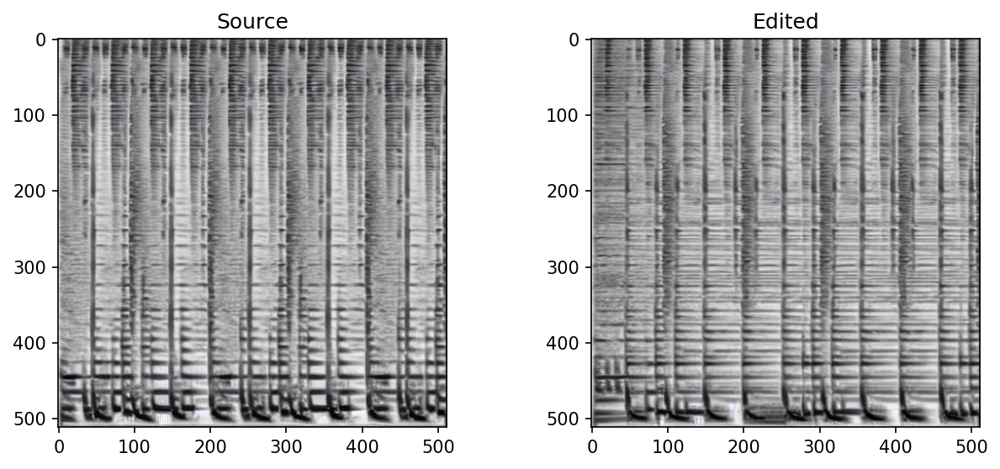

--- Freshly generated target audio ---
🎵 Generating audio for prompt: 'real tekno beat' with seed: 12345


  0%|          | 0/50 [00:00<?, ?it/s]

▶️ Playing generated audio...


💾 Saving audio to generated_audio.wav...
✅ Done.


In [ ]:
print("--- Running New P2P Audio Edit Example ---")

# Let's use the seed from the single generation example for consistency
p2p_seed = 12345

(spec_src, spec_tgt), audio_clips = generate_p2p_audio_edit(
    source_prompt="acid techno beat" ,
    target_prompt= "real tekno beat",
    seed=p2p_seed,
    guidance = 6,
    cross_replace_steps=0.8, # Let's edit for 80% of the steps
)

import matplotlib.pyplot as plt
fig, ax = plt.subplots(1, 2, figsize=(10, 4), dpi=150)
ax[0].imshow(spec_src); ax[0].set_title("Source")
ax[1].imshow(spec_tgt); ax[1].set_title("Edited")
plt.show()

# generating from skratch the target audio for comparison
print("--- Freshly generated target audio ---")

freshgen = generate_audio(
    prompt="real tekno beat",
    seed=12345, guidance = 6
)



🎭 Performing P2P edit:
   Source: 'real tekno beat'
   Target: 'eal tekno beat'


  0%|          | 0/50 [00:00<?, ?it/s]


--- SOURCE AUDIO ---



--- EDITED AUDIO (P2P) ---


✅ Done.


Text(0.5, 1.0, 'Freshly generated')

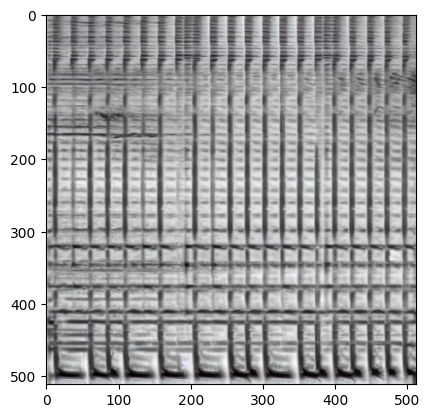

In [ ]:
# just to get the spectogram of the fresh generation of the previous cell, ignore the edit

(spec_src, spec_tgt), audio_clips = generate_p2p_audio_edit(
    source_prompt="real tekno beat" ,
    target_prompt= "real tekno beat",
    seed=p2p_seed,
    guidance = 6,
    cross_replace_steps=0.8, # Let's edit for 80% of the steps
)
import matplotlib.pyplot as plt
plt.imshow(spec_src); ax[0].set_title("Freshly generated");

In [ ]:
from typing import List, Tuple
import numpy as np
import torch
from IPython.display import Audio, display

def _as_list(x):
    return x if isinstance(x, (list, tuple)) else [x]

@torch.no_grad()
def generate_reweighted_audio(
    prompt: str,
    seed: int,
    reweight_instructions: List[Tuple[str, float]],
    focus_words=None,                # None => no LocalBlend (global)
    num_steps: int = 60,
    guidance: float = 4,           # keep modest so reweight isn't drowned out
    cross_gate: float = 0.1,        # >0 so some impls don't skip the hook
    equalizer_gain: float = 3.0,     # amplify (1 + gain*(eq-1)), then clamp
    eq_minmax: Tuple[float,float] = (0.03, 3.0),
):
    print(f"⚖️ Reweight {reweight_instructions} | focus={focus_words if focus_words else 'None'}")

    # --- indices (exact tokens; avoid punctuation on targets) ---
    def _idxs_for(word: str):
        inds = ptp_utils.get_word_inds(prompt, word, tokenizer)
        return [] if inds is None else np.atleast_1d(inds).astype(int).tolist()

    word_positions, weights = [], []
    for word, w in reweight_instructions:
        idxs = _idxs_for(word)
        print(f"  • '{word}' idx={idxs} w={w}")
        if not idxs: continue
        word_positions += idxs
        weights += [float(w)] * len(idxs)

    if not word_positions:
        print("❗ No token positions matched; aborting.")
        return None

    # --- build & AMPLIFY equalizer (no ptp_utils edit needed) ---
    equalizer = ptp_utils.get_equalizer(prompt, word_positions, weights, tokenizer)
    eq = equalizer
    if isinstance(eq, np.ndarray): eq = torch.from_numpy(eq)
    eq = eq.to(device)
    eq = (1 + equalizer_gain * (eq - 1)).clamp(eq_minmax[0], eq_minmax[1])  # <-- key line
    print("   equalizer stats after gain:", float(eq.min()), float(eq.max()))
    equalizer = eq

    # --- optional LocalBlend over union of reweighted tokens ---
    lb = None
    if focus_words is not None:
        fw = focus_words if isinstance(focus_words, (list, tuple)) else [focus_words]
        # If you want “where tokens changed” in general, use the union of reweighted words:
        if focus_words == "AUTO":
            fw = sorted({w for w, _ in reweight_instructions})
        lb = LocalBlend(
            prompts=["", prompt],
            words=[fw, fw],
            tokenizer=tokenizer, device=device,
            start_blend=0.10,                # earlier = more structural
            th=(.3, .3),
            num_ddim_steps=num_steps,
            max_num_words=tokenizer.model_max_length,
        )

    # --- controller ---
    controller = AttentionReweight(
        ["", prompt], num_steps,
        cross_replace_steps=cross_gate,
        self_replace_steps=0.0,
        equalizer=equalizer,
        local_blend=lb,
        tokenizer=tokenizer, device=device
    )

    # --- use same cond/uncond embeds + same latent (fair A/B) ---
    enc = tokenizer(["", prompt], padding="max_length",
                    max_length=tokenizer.model_max_length,
                    truncation=True, return_tensors="pt").to(device)
    hidden = ldm_stable.text_encoder(enc.input_ids)[0]
    unet_dtype = getattr(ldm_stable.unet, "dtype",
                         torch.float16 if torch.cuda.is_available() else torch.float32)
    hidden = hidden.to(device=ldm_stable.unet.device, dtype=unet_dtype)
    neg_embeds, pos_embeds = hidden[:1], hidden[1:2]

    gen = torch.Generator(device=device).manual_seed(seed)
    latent = torch.randn(
        (1, ldm_stable.unet.config.in_channels, 512//8, 512//8),
        generator=gen, device=ldm_stable.unet.device, dtype=unet_dtype
    )

    # reweighted
    ptp_utils.register_attention_control(ldm_stable, controller)
    img_r = ldm_stable(
        prompt_embeds=pos_embeds, negative_prompt_embeds=neg_embeds,
        latents=latent.clone(), num_inference_steps=num_steps,
        guidance_scale=guidance, output_type="pil"
    ).images[0]

    # original
    ptp_utils.register_attention_control(ldm_stable, None)
    img_o = ldm_stable(
        prompt_embeds=pos_embeds, negative_prompt_embeds=neg_embeds,
        latents=latent.clone(), num_inference_steps=num_steps,
        guidance_scale=guidance, output_type="pil"
    ).images[0]

    # convert to audio
    params = SpectrogramParams()
    converter = SpectrogramImageConverter(params=params, device=str(device))
    seg_o = converter.audio_from_spectrogram_image(image=img_o)
    seg_r = converter.audio_from_spectrogram_image(image=img_r)
    sr = seg_o.frame_rate
    wav_o = np.array(seg_o.get_array_of_samples(), dtype=np.float32) / np.iinfo(seg_o.array_type).max
    wav_r = np.array(seg_r.get_array_of_samples(), dtype=np.float32) / np.iinfo(seg_r.array_type).max

    # quick diff
    mse = float(((np.asarray(img_o, np.float32) - np.asarray(img_r, np.float32))**2).mean())
    print(f"🔎 Spectrogram MSE: {mse:.6f}")
    print("\n--- ORIGINAL ---"); display(Audio(wav_o, rate=sr))
    print("--- REWEIGHTED ---"); display(Audio(wav_r, rate=sr))
    write(f"reweight_original_{seed}.wav", sr, (wav_o*32767).astype(np.int16))
    write(f"reweight_edited_{seed}.wav",   sr, (wav_r*32767).astype(np.int16))
    return (img_o, img_r), (wav_o, wav_r), sr


# Local Blend

In [ ]:
def _as_list(x):
    return x if isinstance(x, (list, tuple)) else [x]

def make_local_blend_swap(
    source_prompt: str,
    target_prompt: str,
    src_focus_words,   # e.g. "cat"   or ["acid"]
    tgt_focus_words,   # e.g. "dog"   or ["real","tekno"]
    num_steps: int,
    start_blend: float = 0.15,
    th=(.3, .3),
):
    """
    Build a LocalBlend that localizes edits around source tokens in the source prompt
    and target tokens in the target prompt (cat->dog, acid->tekno, piano->violin, ...).
    """
    src_focus_words = _as_list(src_focus_words)
    tgt_focus_words = _as_list(tgt_focus_words)

    prompts = [source_prompt, target_prompt]
    words   = [src_focus_words, tgt_focus_words]  # <- different for src vs tgt

    lb = LocalBlend(
        prompts=prompts,
        words=words,
        tokenizer=tokenizer,
        device=device,
        start_blend=start_blend,
        th=th,
        num_ddim_steps=num_steps,
        max_num_words=tokenizer.model_max_length,
    )
    return lb


In [ ]:
def generate_p2p_audio_edit_localblend(
    source_prompt: str,
    target_prompt: str,
    src_focus_words,
    tgt_focus_words,
    seed: int,
    num_steps: int = 50,
    guidance: float = 2.0,
    cross_replace_steps: float = 0.8,
    self_replace_steps: float = 0.2,
):
    prompts = [source_prompt, target_prompt]

    # build LocalBlend with different focus words for src/tgt
    lb = make_local_blend_swap(
        source_prompt, target_prompt,
        src_focus_words, tgt_focus_words,
        num_steps=num_steps, start_blend=0.15, th=(.3,.3)
    )

    controller = AttentionReplace(
        prompts, num_steps,
        cross_replace_steps=cross_replace_steps,
        self_replace_steps=self_replace_steps,
        local_blend=lb,                     # <-- key bit
        tokenizer=tokenizer, device=device
    )

    images = _run_p2p_generation(prompts, controller, seed, num_steps, guidance)
    source_spectrogram, edited_spectrogram = images[0], images[1]

    # image -> audio
    params = SpectrogramParams()
    converter = SpectrogramImageConverter(params=params, device=str(device))
    src_seg = converter.audio_from_spectrogram_image(image=source_spectrogram)
    src_np  = np.array(src_seg.get_array_of_samples(), dtype=np.float32) / np.iinfo(src_seg.array_type).max
    sr      = src_seg.frame_rate
    tgt_seg = converter.audio_from_spectrogram_image(image=edited_spectrogram)
    tgt_np  = np.array(tgt_seg.get_array_of_samples(), dtype=np.float32) / np.iinfo(tgt_seg.array_type).max

    print("\n--- SOURCE ---"); display(Audio(src_np, rate=sr))
    print("--- EDITED ---"); display(Audio(tgt_np, rate=sr))
    write(f"p2p_source_{seed}.wav", sr, (src_np*32767).astype(np.int16))
    write(f"p2p_edited_{seed}.wav", sr, (tgt_np*32767).astype(np.int16))
    return (source_spectrogram, edited_spectrogram), (src_np, tgt_np), sr


## LOCAL BLEND EX ON PRESENTATION

  0%|          | 0/50 [00:00<?, ?it/s]


--- SOURCE ---


--- EDITED ---


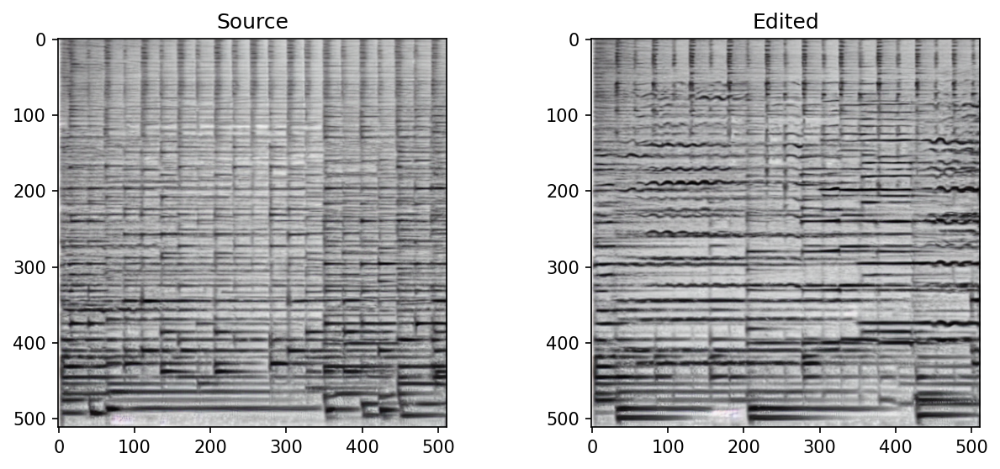

In [ ]:
# audio: piano -> violin (keep the rest)
spectograms, images, _ = generate_p2p_audio_edit_localblend(
    "solo piano clean melody only piano, no vocals",
    "solo violin clean melody only violin, no vocals",
    cross_replace_steps = 0.2,
    self_replace_steps = 0.1,
    src_focus_words="piano",
    tgt_focus_words="violin",
    seed=12345, guidance=7.0
)

fig, ax = plt.subplots(1, 2, figsize=(10, 4), dpi=150)
ax[0].imshow(spectograms[0]); ax[0].set_title("Source")
ax[1].imshow(spectograms[1]); ax[1].set_title("Edited")
plt.show()

🎭 Performing P2P edit:
   Source: 'solo violin clean melody only violin, no vocals'
   Target: 'solo violin clean melody only violin, no vocals'


  0%|          | 0/50 [00:00<?, ?it/s]


--- SOURCE AUDIO ---



--- EDITED AUDIO (P2P) ---


✅ Done.


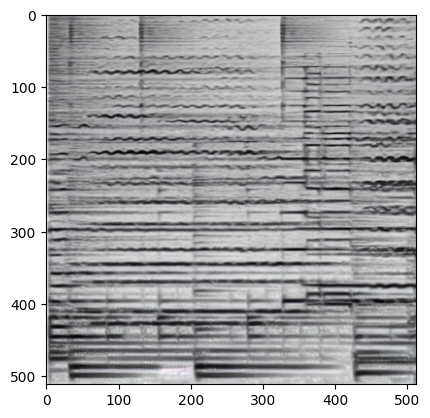

In [ ]:
# compare it with fresh generation of target
spectogram, audio_clip = generate_p2p_audio_edit(
    source_prompt= "solo violin clean melody only violin, no vocals" ,
    target_prompt= "solo violin clean melody only violin, no vocals", # don't need p2p but just source generation
    seed=12345,
    guidance = 7
)
plt.imshow(spectogram[0]); ax[0].set_title("Freshly generated");

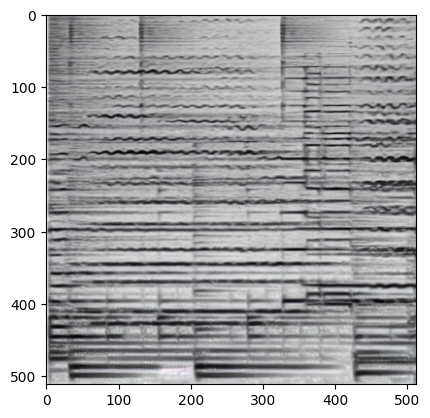

## Local blend and reweighting

In [ ]:
generate_reweighted_audio(
    prompt="rock motive with electric guitar and bass",
    seed=12345,
    reweight_instructions=[ ("rock", 0.1), ("guitar", 0.2), ("bass", 1.9)],
    focus_words=["rock", "guitar", "bass"],
    num_steps=60, guidance=2.0
)

⚖️ Reweight: [('rock', 0.1), ('guitar', 0.2), ('bass', 1.9)] | focus=['rock', 'guitar', 'bass']
  • 'rock' idx: [1] weight: 0.1
  • 'guitar' idx: [5] weight: 0.2
  • 'bass' idx: [7] weight: 1.9
   equalizer shape=(1, 77) min=0.100 max=1.000


  0%|          | 0/60 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]


--- ORIGINAL ---


--- REWEIGHTED (LocalBlend) ---


((<PIL.Image.Image image mode=RGB size=512x512>,
  <PIL.Image.Image image mode=RGB size=512x512>),
 (array([-0.01116977, -0.01232948, -0.01388592, ..., -0.07928709,
          0.13208412,  0.23014008], dtype=float32),
  array([0.00170904, 0.00067141, 0.00042726, ..., 0.03765984, 0.02139348,
         0.00601215], dtype=float32)),
 44100)